In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image

In [ ]:
!cp /content/drive/MyDrive/DL_DATA/DL_Face_REC/data_age_val.hdf5 /content/

In [ ]:
def classify_age_group(file):
    age_groups = {
        '0-10': [],
        '11-20': [],
        '21-30': [],
        '31-40': [],
        '41-50': [],
        '51-60': [],
        '61+': [],
    }

    # 'age' 그룹 내의 모든 키를 순회하며 연령대별로 분류
    for key in file['age'].keys():
        age = file['age'][key][()]
        if age <= 10:
            age_groups['0-10'].append(key)
        elif age <= 20:
            age_groups['11-20'].append(key)
        elif age <= 30:
            age_groups['21-30'].append(key)
        elif age <= 40:
            age_groups['31-40'].append(key)
        elif age <= 50:
            age_groups['41-50'].append(key)
        elif age <= 60:
            age_groups['51-60'].append(key)
        else:
            age_groups['61+'].append(key)

    return age_groups


hdf5_file_path = '/content/data_age_val.hdf5'
with h5py.File(hdf5_file_path, 'r') as file:
    age_groups = classify_age_group(file)

for group, keys in age_groups.items():
    print(f"{group}: {len(keys)} images")

0-10: 1103 images
11-20: 1560 images
21-30: 1107 images
31-40: 596 images
41-50: 471 images
51-60: 175 images
61+: 38 images


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [ ]:
!pip install facenet-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 10.1 MB/s eta 0:00:00


In [ ]:
from facenet_pytorch import InceptionResnetV1

def make_age_model():
    model = InceptionResnetV1(classify=True, pretrained='vggface2', num_classes=1)
    in_dim = model.logits.in_features
    model.logits = nn.Linear(in_dim, 1)
    return model

model = make_age_model()

  0%|          | 0.00/107M [00:00<?, ?B/s]

In [ ]:
def load_model(model, path):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    checkpoint = torch.load(path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    return model

model_path = '/content/drive/MyDrive/DL_DATA/DL_Face_REC/Model/inception_resnet_v1/age_model_checkpoint_epoch_10_loss_4.57.pth'
age_model = load_model(model, model_path)

# 나이 추정

In [ ]:
def predict_age(image, box, model):
    image = Image.fromarray(image)
    image = image.crop((box[0], box[1], box[0] + box[2], box[1] + box[3]))

    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.6284, 0.4901, 0.4325], std=[0.1869, 0.1712, 0.1561]),
    ])
    image = preprocess(image).unsqueeze(0)  # 배치 차원 추가

    image = image.to(device)
    model = model.to(device)

    model.eval()

    with torch.no_grad():
        prediction = model(image)

    return prediction.item()

# 연령대별 예측 정확도

In [ ]:
def calculate_accuracy_by_age_group(hdf5_file_path, age_groups, model):
    accuracies = {}
    with h5py.File(hdf5_file_path, 'r') as file:
        for group, keys in age_groups.items():
            correct_predictions = 0
            total_predictions = len(keys)
            for key in keys:
                image_data = np.array(file['image'][key][:])
                actual_age = file['age'][key][()]
                box = file['box'][key][()]

                predicted_age = predict_age(image_data, box, model)

                if abs(predicted_age - actual_age) <= 5:
                    correct_predictions += 1

            accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
            accuracies[group] = accuracy

    return accuracies

In [ ]:
accuracies = calculate_accuracy_by_age_group(hdf5_file_path, age_groups, age_model)

# 결과 출력
for group, accuracy in accuracies.items():
    print(f'Group {group}: Accuracy = {accuracy*100:.2f}%')

Group 0-10: Accuracy = 86.31%
Group 11-20: Accuracy = 75.19%
Group 21-30: Accuracy = 67.03%
Group 31-40: Accuracy = 43.46%
Group 41-50: Accuracy = 43.95%
Group 51-60: Accuracy = 41.14%
Group 61+: Accuracy = 7.89%


In [ ]:
with h5py.File('/content/data_age_val.hdf5', 'r') as file:
    keys = list(file['age'].keys())
    ages = []
    for key in file['age'].keys():
        age = file['age'][key][()]
        ages.append(age)

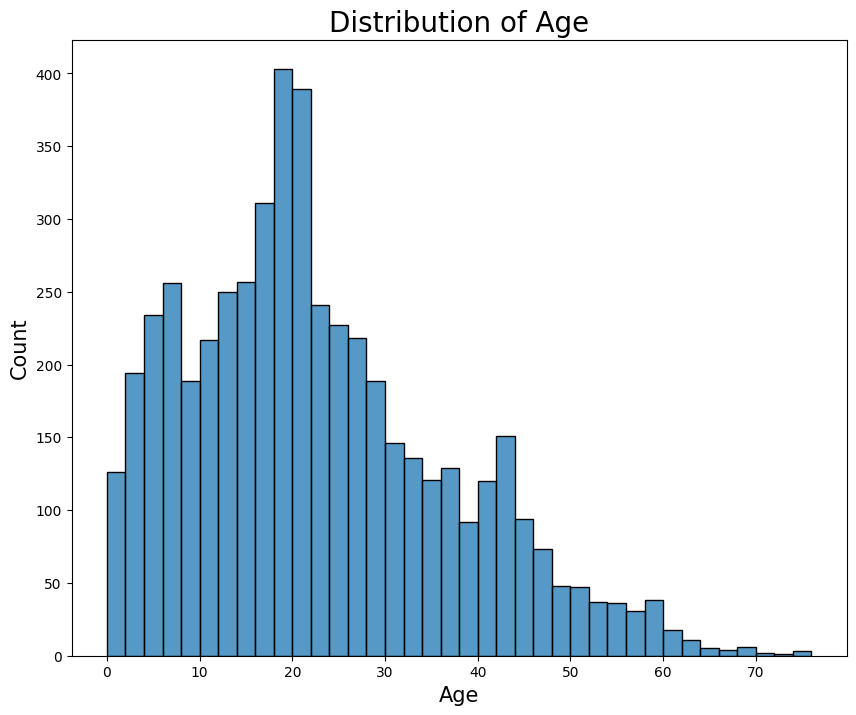

In [ ]:
plt.figure(figsize=(10, 8))
sns.histplot(data=ages, binwidth=2)
plt.xlabel('Age', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.title('Distribution of Age', fontsize=20)
plt.show()

# 연령대별 샘플 이미지

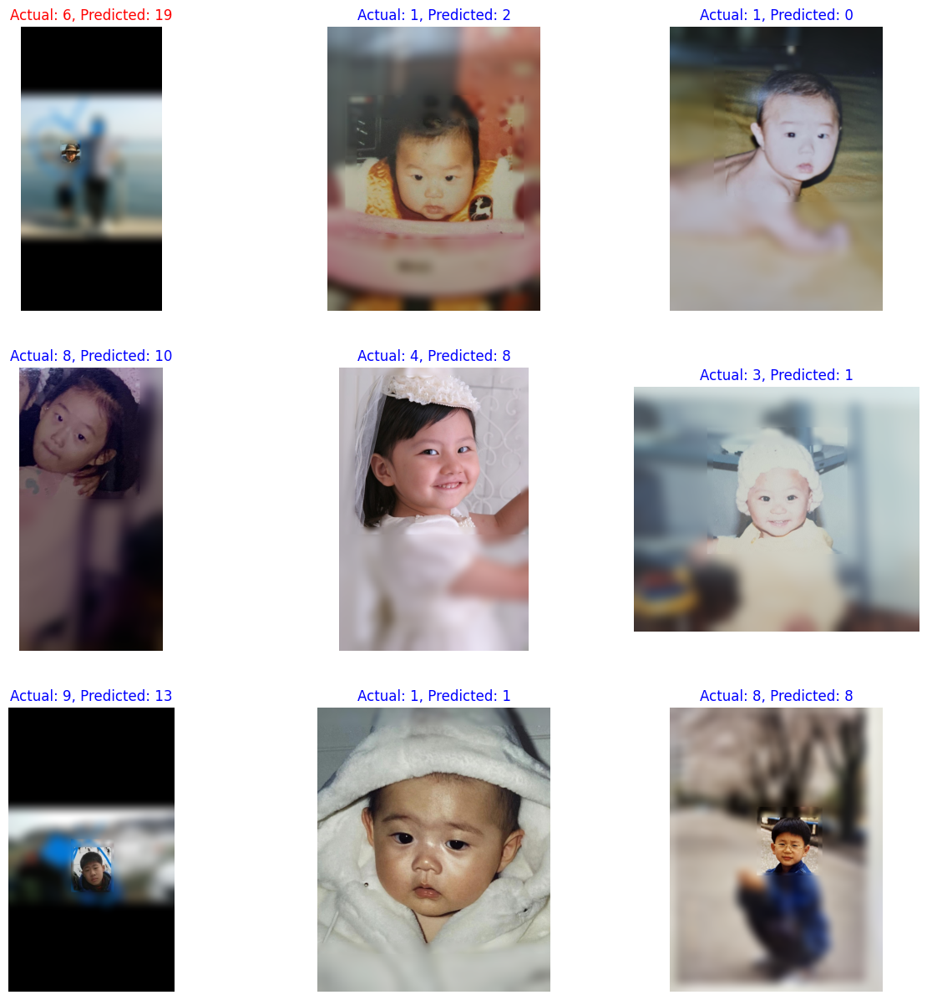

In [ ]:
import random

def show_sample_predictions(ages):
    with h5py.File(hdf5_file_path, 'r') as file:
        sample_keys = random.sample(age_groups[ages], 9)

        fig, axs = plt.subplots(3, 3, figsize=(15, 15))
        axs = axs.ravel()

        for i, key in enumerate(sample_keys):
            image_data = np.array(file['image'][key][:])
            actual_age = file['age'][key][()]
            box = file['box'][key][()]

            predicted_age = int(predict_age(image_data, box, model))
            title_color = 'blue' if abs(predicted_age - actual_age) <=5 else 'red'

            image = Image.fromarray(image_data)
            axs[i].imshow(image)
            axs[i].set_title(f'Actual: {actual_age}, Predicted: {predicted_age}', color=title_color)
            axs[i].axis('off')

        plt.show()

show_sample_predictions('0-10')

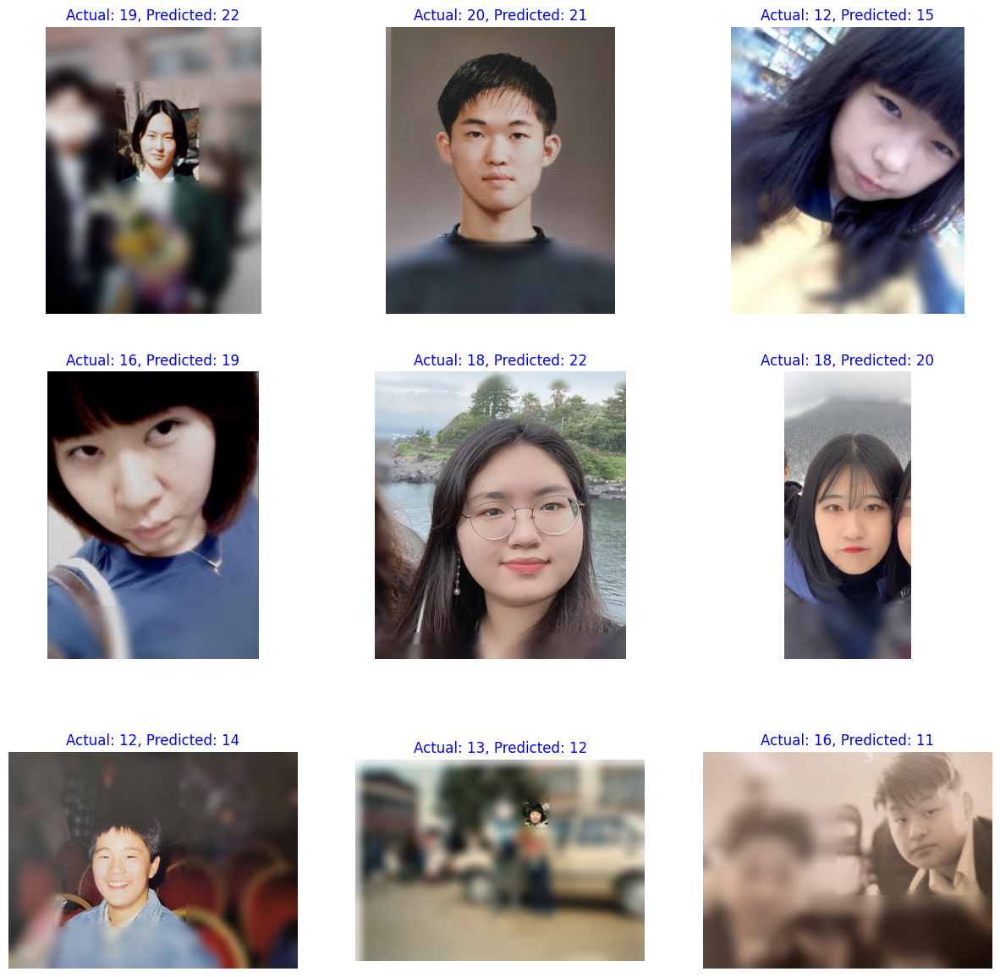

In [ ]:
show_sample_predictions('11-20')

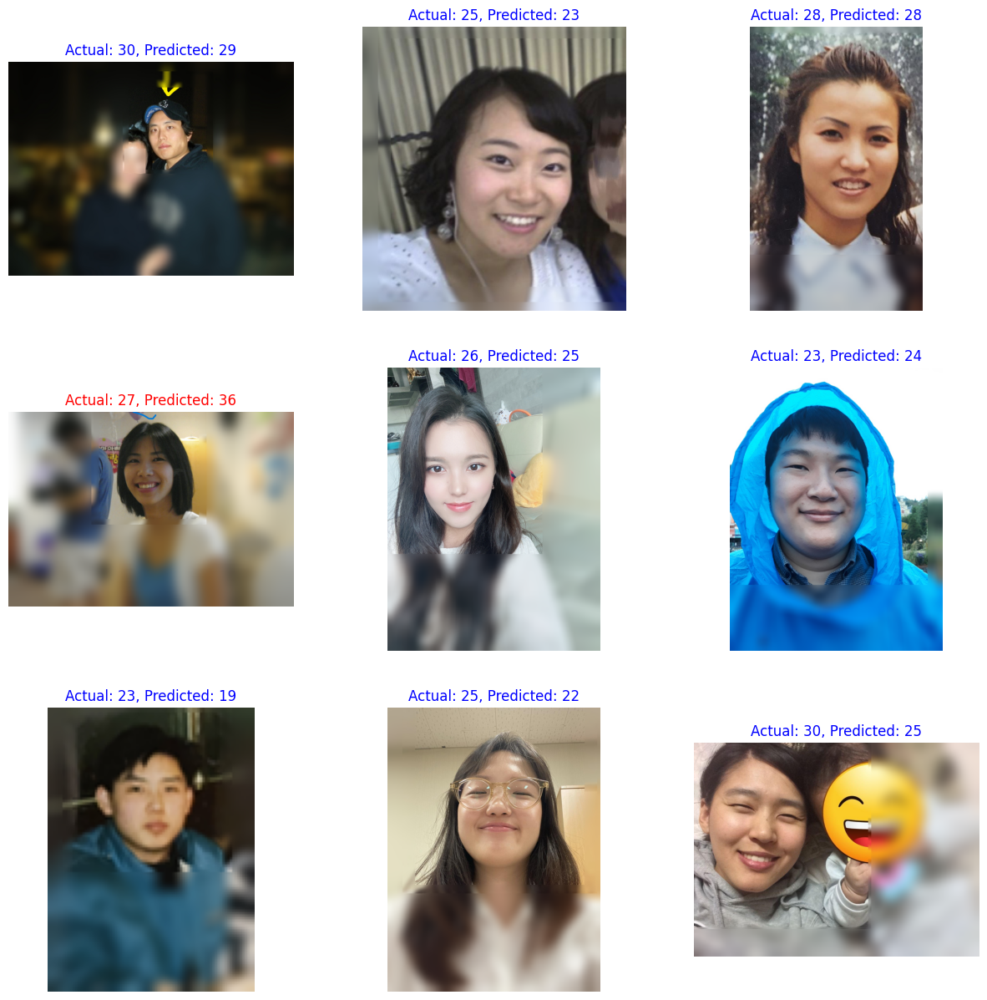

In [ ]:
show_sample_predictions('21-30')

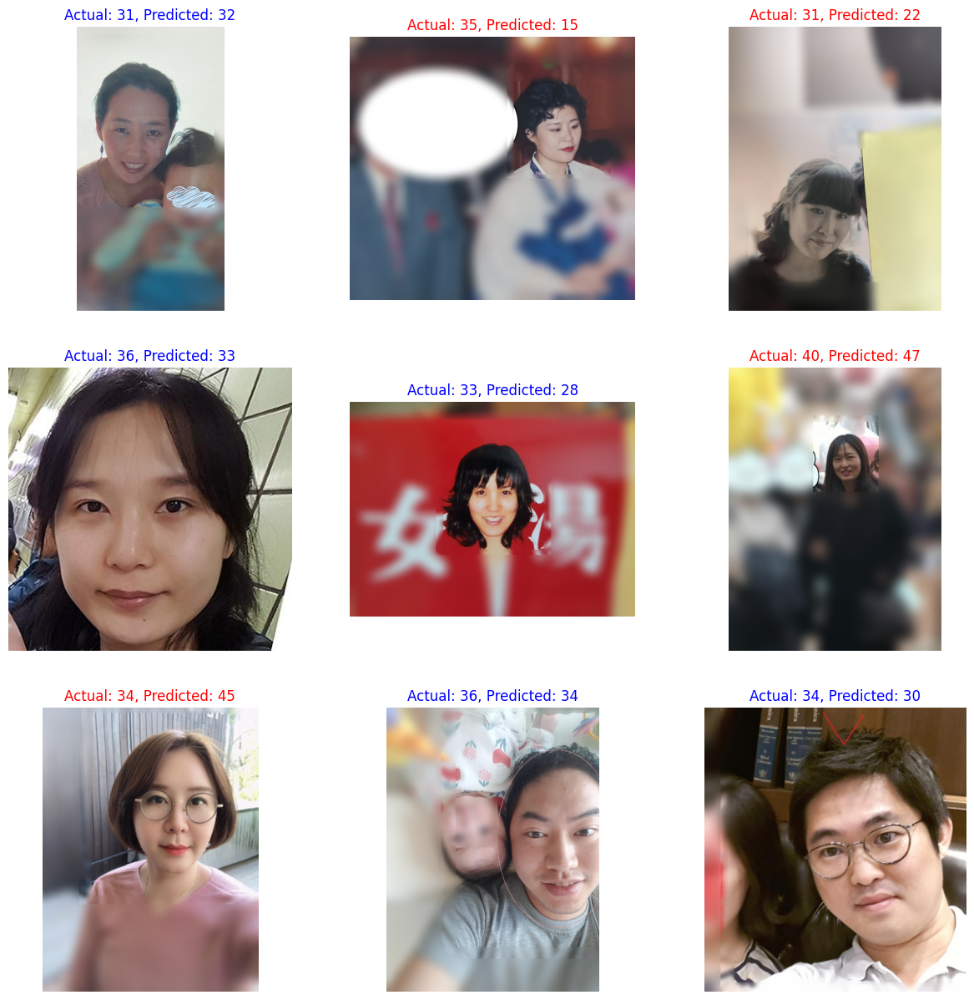

In [ ]:
show_sample_predictions('31-40')

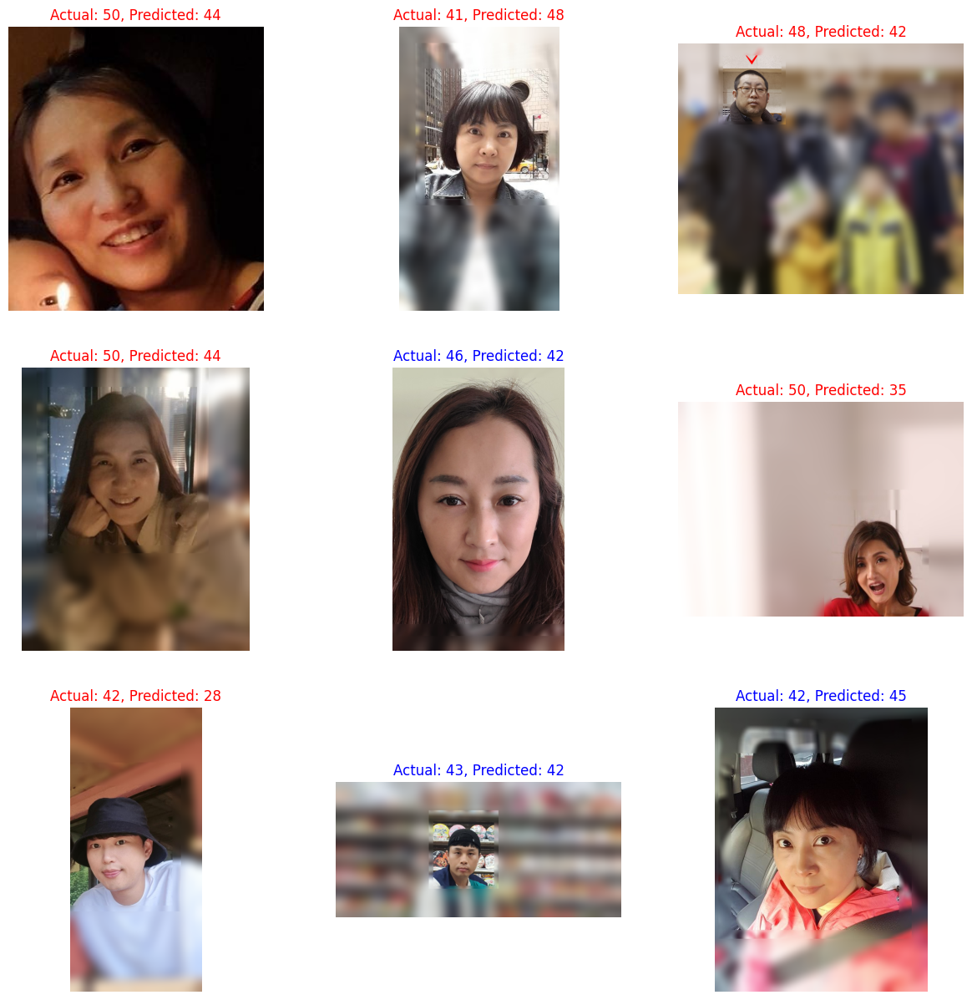

In [ ]:
show_sample_predictions('41-50')

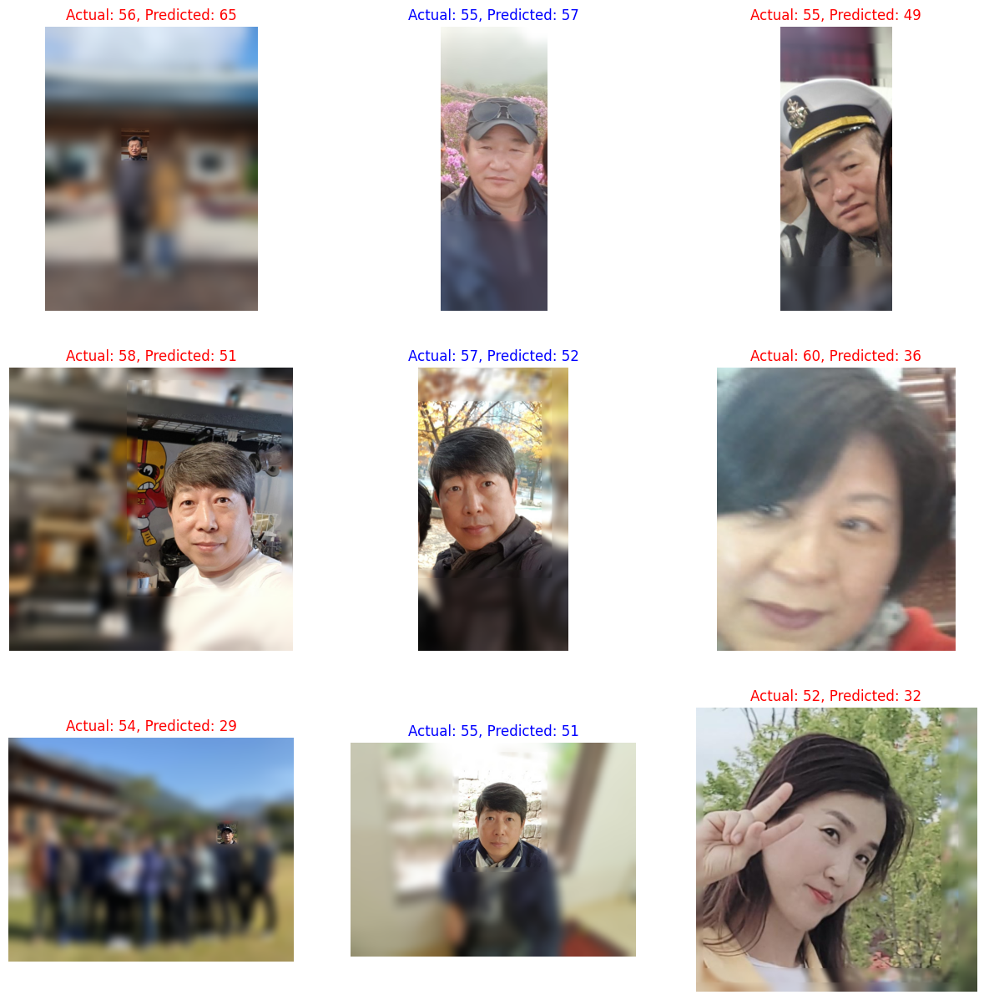

In [ ]:
show_sample_predictions('51-60')

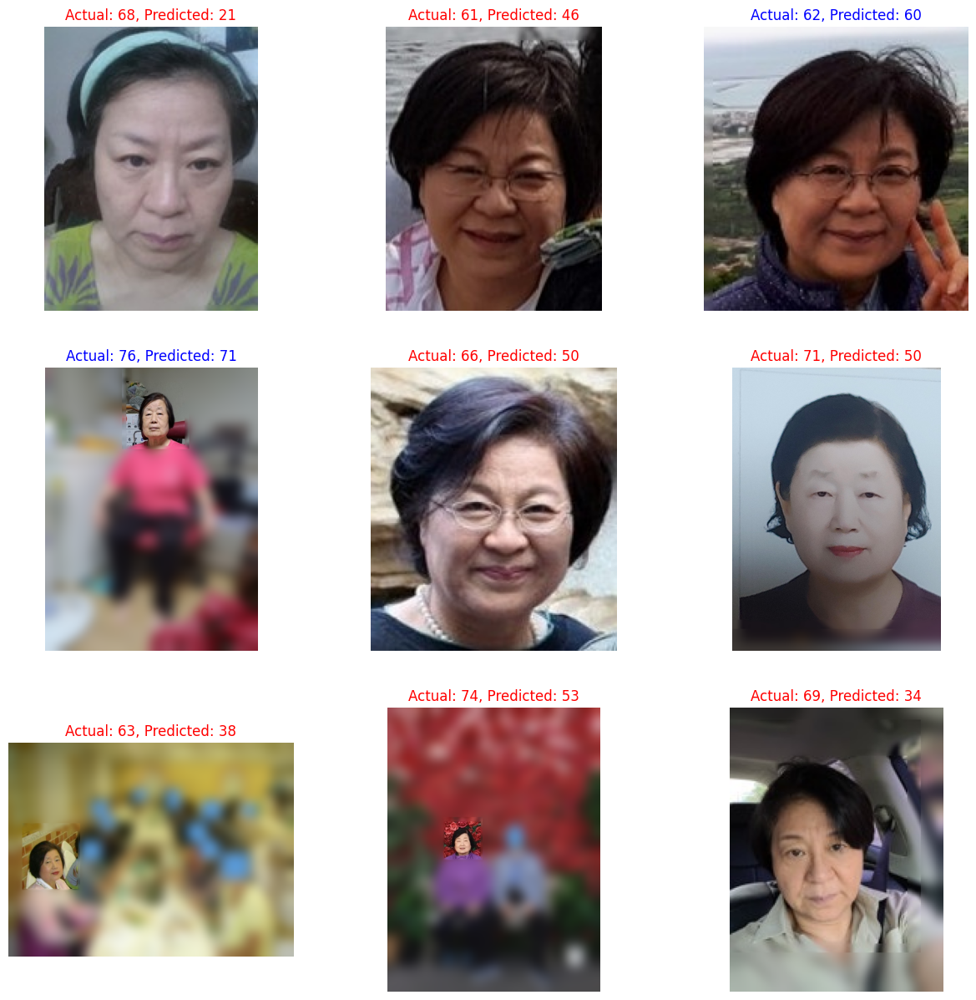

In [ ]:
show_sample_predictions('61+')

# Retinanet

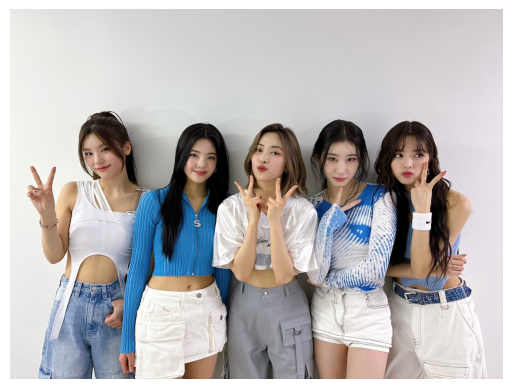

In [ ]:
import requests
from io import BytesIO

image_url = 'https://kpopping.com/documents/0f/1/2048/230304-ITZY-Twitter-Update-documents-2.jpeg?v=32813'
response = requests.get(image_url)
image = Image.open(BytesIO(response.content))
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
from torchvision.models.detection import retinanet_resnet50_fpn
from torchvision.transforms import functional as F
import matplotlib.patches as patches

retinanet = retinanet_resnet50_fpn(weights='COCO_V1')

retinanet.eval()
image_tensor = F.to_tensor(image).unsqueeze(0)

with torch.no_grad():
    output = retinanet(image_tensor)

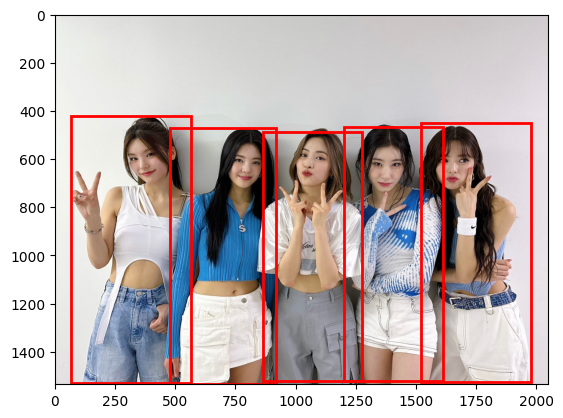

In [ ]:
confidence_threshold = 0.7

scores = output[0]['scores']
boxes = output[0]['boxes']

fig, ax = plt.subplots(1)
ax.imshow(image)
for score, box in zip(scores, boxes):
    if score > confidence_threshold:
        xmin, ymin, xmax, ymax = box.cpu().numpy()
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

plt.show()

In [ ]:
!pip install retina-face

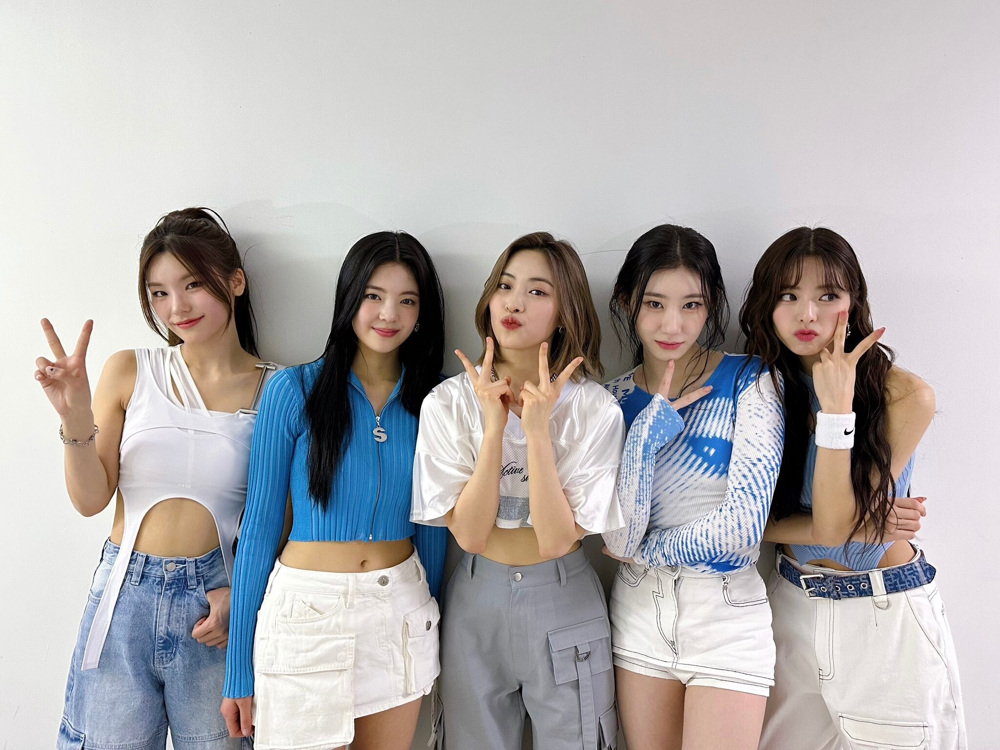

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

image_url = 'https://kpopping.com/documents/0f/1/2048/230304-ITZY-Twitter-Update-documents-2.jpeg?v=32813'
response = requests.get(image_url)

image_stream = BytesIO(response.content)
image_stream.seek(0)
file_bytes = np.asarray(bytearray(image_stream.read()), dtype=np.uint8)
image = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)

cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
from retinaface import RetinaFace

resp = RetinaFace.detect_faces(image)
resp

{'face_1': {'score': 0.9997211694717407,
  'facial_area': [297, 504, 460, 701],
  'landmarks': {'right_eye': [328.3875, 600.7403],
   'left_eye': [394.54443, 587.94885],
   'nose': [361.185, 638.8282],
   'mouth_right': [355.6853, 662.1845],
   'mouth_left': [411.89795, 650.0401]}},
 'face_2': {'score': 0.999252438545227,
  'facial_area': [722, 533, 862, 721],
  'landmarks': {'right_eye': [764.59283, 607.75494],
   'left_eye': [831.0452, 616.98816],
   'nose': [796.2603, 652.5813],
   'mouth_right': [758.203, 668.21704],
   'mouth_left': [818.1563, 676.05475]}},
 'face_3': {'score': 0.9990822076797485,
  'facial_area': [1300, 542, 1448, 740],
  'landmarks': {'right_eye': [1340.1798, 621.391],
   'left_eye': [1414.9769, 626.94037],
   'nose': [1375.211, 678.7782],
   'mouth_right': [1342.7905, 695.60986],
   'mouth_left': [1401.191, 700.16766]}},
 'face_4': {'score': 0.9990737438201904,
  'facial_area': [1576, 526, 1735, 727],
  'landmarks': {'right_eye': [1616.8187, 607.86676],
   'lef

Facial area: [297, 504, 460, 701]
297 504 460 701
Facial area: [722, 533, 862, 721]
722 533 862 721
Facial area: [1300, 542, 1448, 740]
1300 542 1448 740
Facial area: [1576, 526, 1735, 727]
1576 526 1735 727
Facial area: [1001, 510, 1147, 711]
1001 510 1147 711


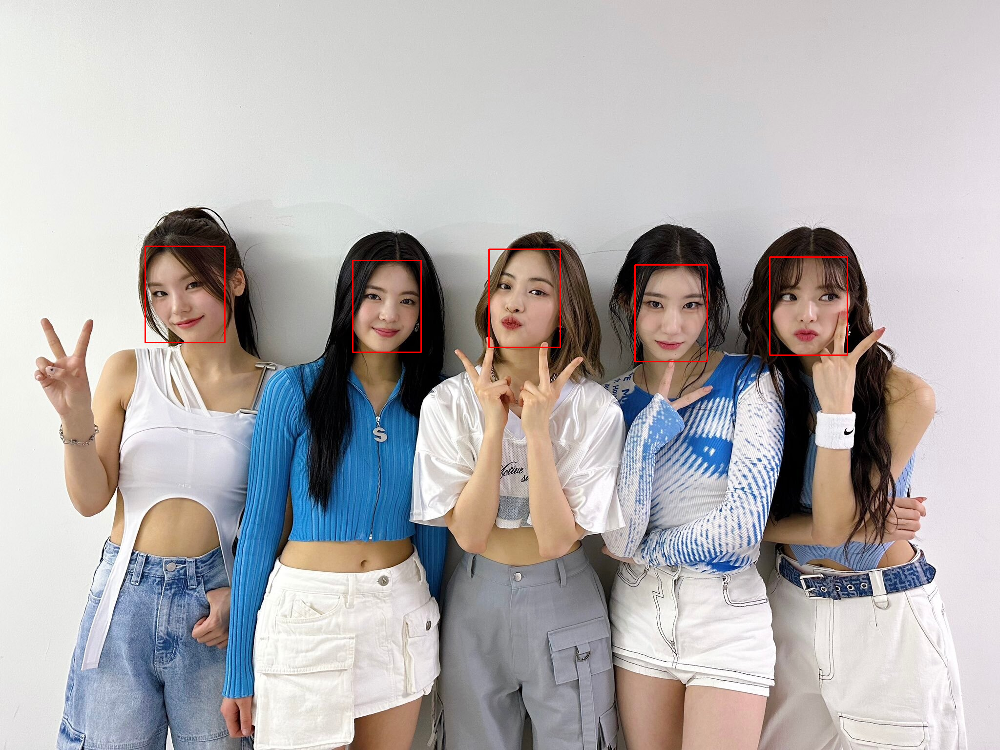

In [ ]:
detect_image = image.copy()

for face in resp:
  facial_area = resp[face]['facial_area']
  print('Facial area:', facial_area)
  x, y, w, h = facial_area[0], facial_area[1],facial_area[2],facial_area[3]
  print(x,y,w,h)
  cv2.rectangle(detect_image, (x,y), (w,h), (0,0,255), 2)

# #  결과 출력
cv2_imshow(detect_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
image_url = 'https://kpopping.com/documents/0f/1/2048/230304-ITZY-Twitter-Update-documents-2.jpeg?v=32813'
response = requests.get(image_url)
image = Image.open(BytesIO(response.content))
image_np = np.array(image)

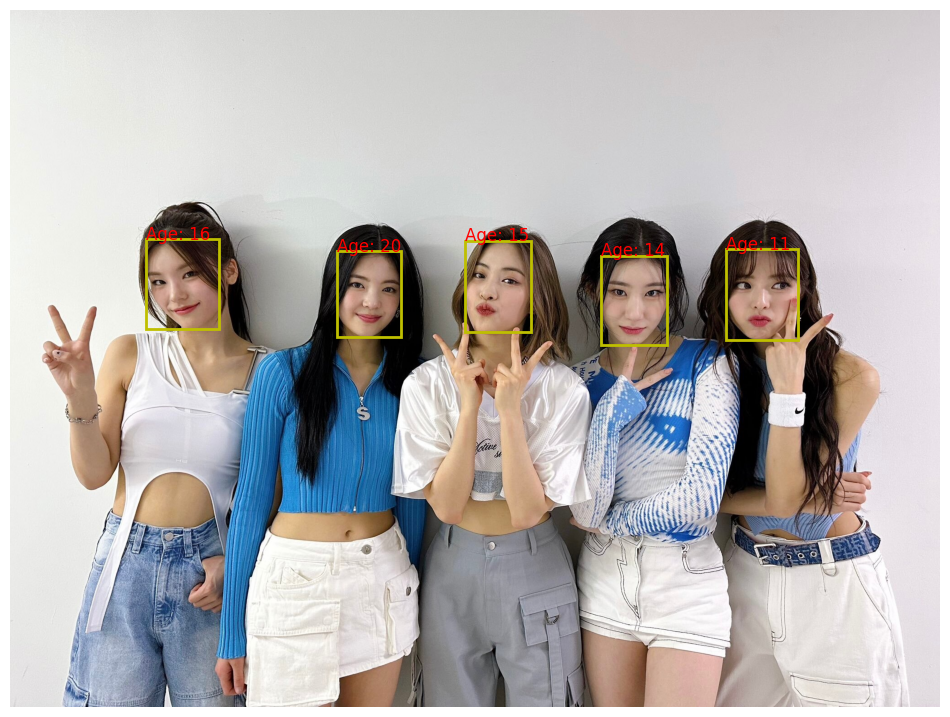

In [ ]:
def visualize_predictions(image, resp, model):
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(image)

    for face in resp.values():
        box = face['facial_area']
        age = predict_age(np.array(image), box, model)

        rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                                 linewidth=2, edgecolor='y', facecolor='none')
        ax.add_patch(rect)

        plt.text(box[0], box[1], f'Age: {int(age)}', color='red', fontsize=12)

    plt.axis('off')
    plt.show()

resp = RetinaFace.detect_faces(image_np)
visualize_predictions(image, resp, age_model)

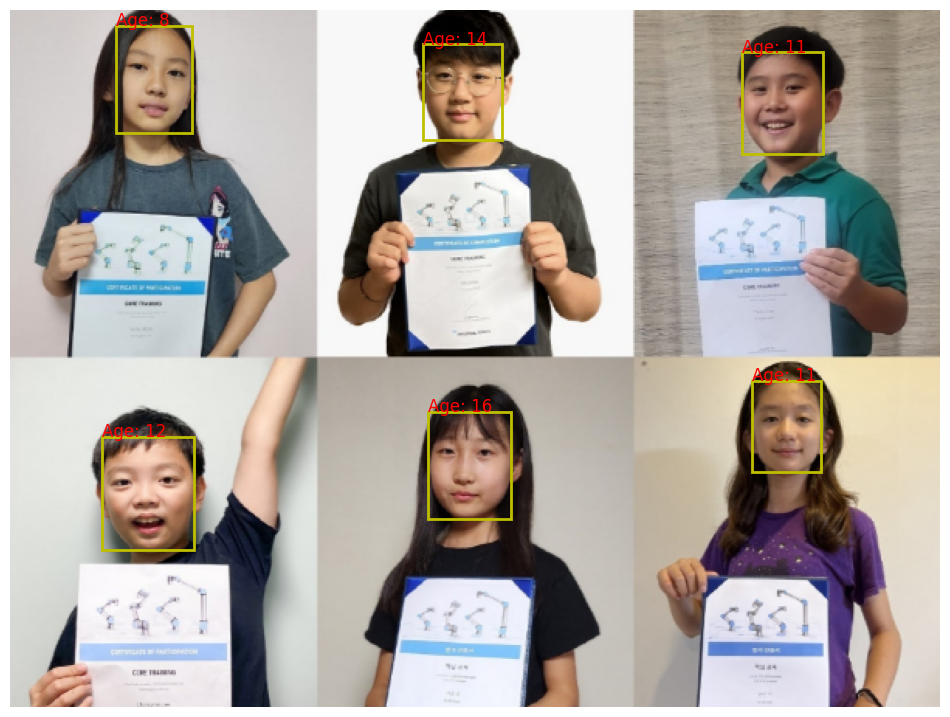

In [ ]:
image_url = 'http://www.irobotnews.com/news/photo/202310/32983_70512_3222.png'
response = requests.get(image_url)
image = Image.open(BytesIO(response.content))
image_np = np.array(image)

resp = RetinaFace.detect_faces(image_np)
visualize_predictions(image, resp, age_model) # 가운데 2명 6학년, 나머지 4명 4학년

- 학습 데이터의 영향으로 전반적으로 나이를 어리게 예측하는 경향성이 있음